In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread('lenna.jpg',1)

In [3]:
def my_show(img):
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

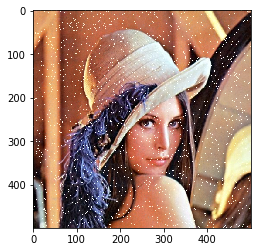

In [4]:
my_show(img)

## Gaussian Kernel: For Smooth/Denoise/Blur the image

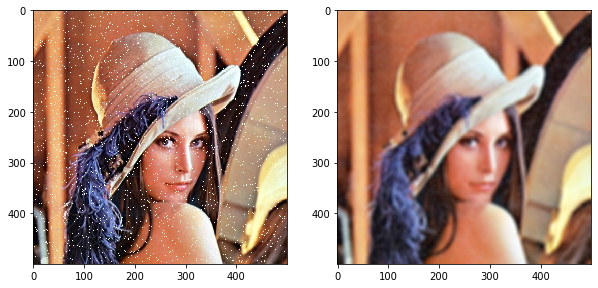

In [5]:
g_img = cv2.GaussianBlur(img,(11,11),4)
plt.figure(figsize=(10,10))
plt.subplot(121)
my_show(img)
plt.subplot(122)
my_show(g_img)

In [7]:
## The bigger the kernel size, the blurer the image becomes
kernel_1d_1 = cv2.getGaussianKernel(5,2)
kernel_1d_2 = cv2.getGaussianKernel(10,2)

In [8]:
print(kernel_1d_2.shape)
print(kernel_1d_2)

(10, 1)
[[0.01605491]
 [0.04364178]
 [0.09238965]
 [0.15232478]
 [0.19558888]
 [0.19558888]
 [0.15232478]
 [0.09238965]
 [0.04364178]
 [0.01605491]]


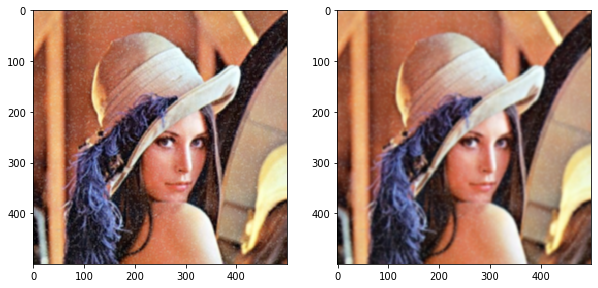

In [9]:
g1_img_1 = cv2.sepFilter2D(img,-1,kernel_1d_1,kernel_1d_1)
g1_img_2 = cv2.sepFilter2D(img,-1,kernel_1d_2,kernel_1d_2)
plt.figure(figsize=(10,10))
plt.subplot(121)
my_show(g1_img_1)
plt.subplot(122)
my_show(g1_img_2)

## Laplacian: Sharpening the image

In [13]:
kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
print(kernel)

[[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]


In [14]:
orig_image_mask = np.array([[0,0,0],[0,1,0],[0,0,0]])

In [20]:
g_img = cv2.GaussianBlur(img,(7,7),2)
## cv2.filter2D will do convolution with the given kernel on the given image
lap_img_1 = cv2.filter2D(img,-1,kernel)
## After GaussianBlur, g_img become bluring. So Laplacian can only detect a little sharp points in this image.
lap_img_2 = cv2.filter2D(img,-1,kernel+orig_image_mask)

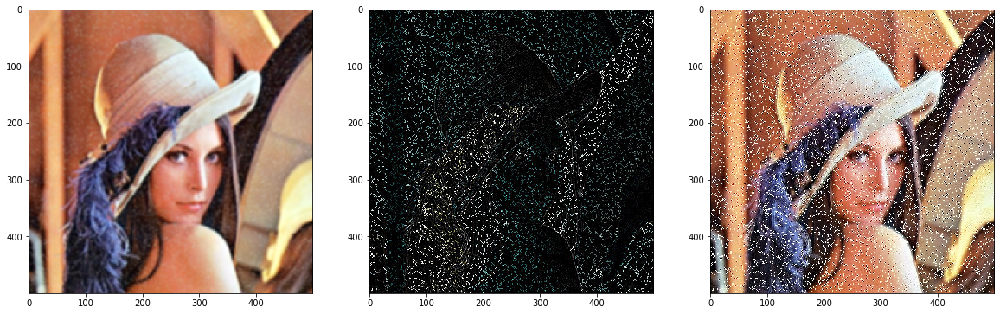

In [21]:
plt.figure(figsize=(20,20))
plt.subplot(131)
my_show(g_img)
plt.subplot(132)
my_show(lap_img_1)
plt.subplot(133)
my_show(lap_img_2)

In [25]:
## The stronger Laplacian can detect more than the former one.
kernel_strong = np.array([[1,1,1],[1,-8,1],[1,1,1]])
lap_img_3 = cv2.filter2D(img,-1,kernel_strong)
lap_img_4 = cv2.filter2D(g_img,-1,kernel_strong)   # The image after gaussain blur has little edge

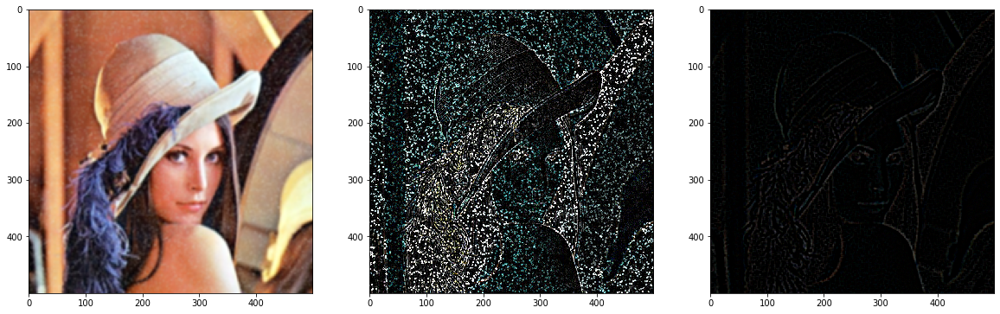

In [26]:
plt.figure(figsize=(20,20))
plt.subplot(131)
my_show(g_img)
plt.subplot(132)
my_show(lap_img_3)
plt.subplot(133)
my_show(lap_img_4)

## 图像锐化

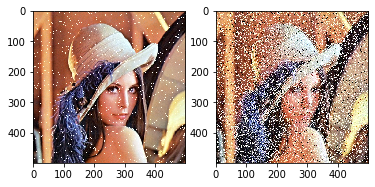

In [14]:
# The former kernel_strong plus [[0,0,0],[0,1,0],[0,0,0]] => Add the original pixel at every point.
kernel_strong = np.array([[1,1,1],[1,-7,1],[1,1,1]])
lap_img = cv2.filter2D(img,-1,kernel_strong)
plt.subplot(121)
my_show(img)
plt.subplot(122)
my_show(lap_img)

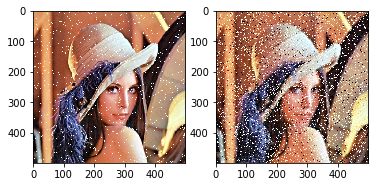

In [15]:
kernel_strong = np.array([[0,1,0],[1,-3,1],[0,1,0]])
lap_img = cv2.filter2D(img,-1,kernel_strong)
plt.subplot(121)
my_show(img)
plt.subplot(122)
my_show(lap_img)

## Sobel: Calculate the derivative of the original image  => Detect the edge 

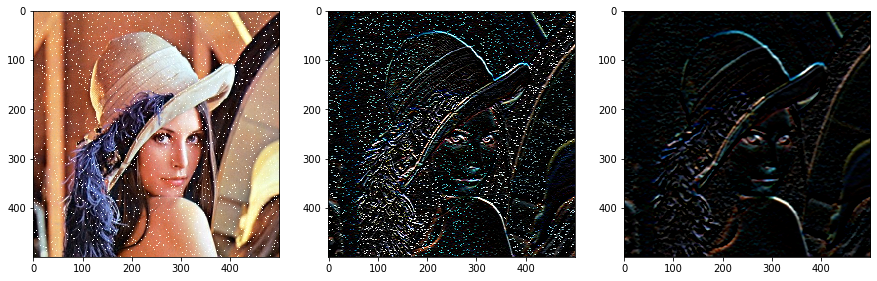

In [29]:
y_kernel = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
g_img = cv2.GaussianBlur(img,(7,7),2)
sy_img = cv2.filter2D(img,-1,y_kernel)
gy_img = cv2.filter2D(g_img,-1,y_kernel)
plt.figure(figsize=(15,15))
plt.subplot(131)
my_show(img)
plt.subplot(132)
my_show(sy_img)
plt.subplot(133)
my_show(gy_img)

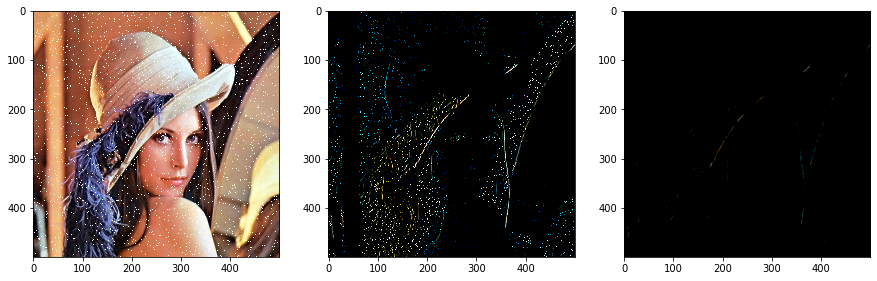

In [30]:
x_kernel = np.array([[-1,0,-1],[-2,0,2],[-1,0,1]])
sx_img = cv2.filter2D(img,-1,x_kernel)
gx_img = cv2.filter2D(g_img,-1,x_kernel)
plt.figure(figsize=(15,15))
plt.subplot(131)
my_show(img)
plt.subplot(132)
my_show(sx_img)
plt.subplot(133)
my_show(gx_img)

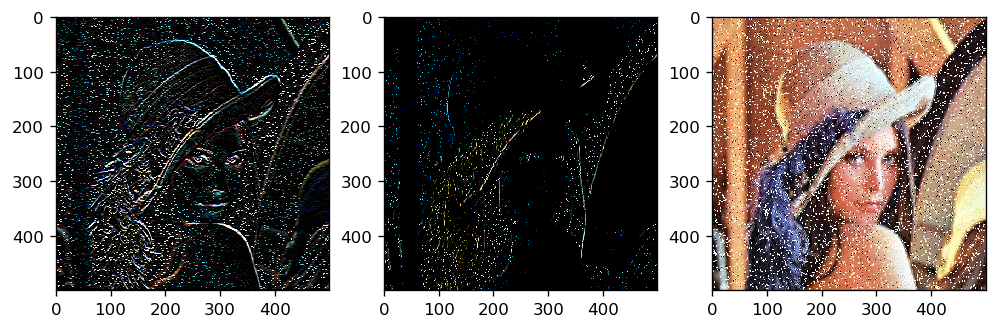

In [18]:
plt.figure(figsize=(10,10),dpi=120)
plt.subplot(131)
my_show(sy_img)
plt.subplot(132)
my_show(sx_img)
plt.subplot(133)
my_show(lap_img)


## medianblur

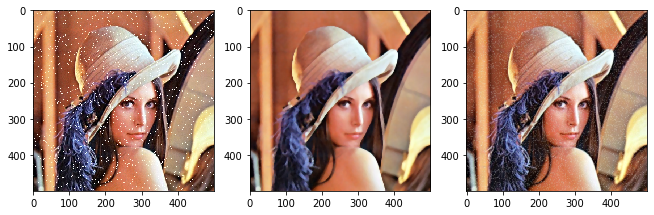

In [19]:
md_img = cv2.medianBlur(img,7)
plt.figure(figsize=(11,11))
plt.subplot(131)
my_show(img)
plt.subplot(132)
my_show(md_img)
plt.subplot(133)
my_show(g_img)

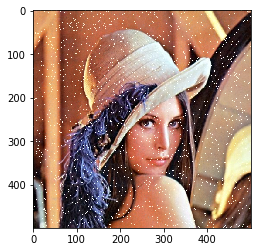

In [20]:
noise_img = cv2.imread('lenna.jpg',1)
my_show(noise_img)

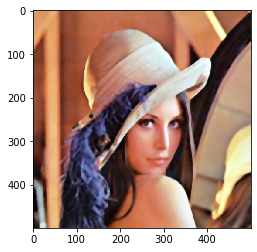

In [21]:
denoise_img = cv2.medianBlur(noise_img,7)
my_show(denoise_img)

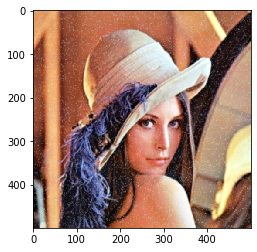

In [22]:
denoise_img = cv2.GaussianBlur(noise_img,(3,3),2)
my_show(denoise_img)

## Harris Corner

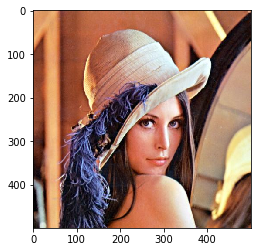

In [23]:
img = cv2.imread('lenna_orig.jpg',1)
my_show(img)

In [24]:
img_gray = (cv2.cvtColor(img,cv2.COLOR_BGR2GRAY))

In [25]:
def my_show_gray(img):
    plt.imshow(img,cmap='gray')

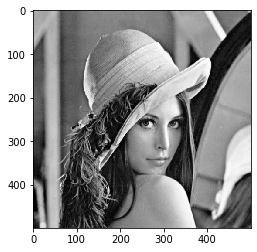

In [26]:
my_show_gray(img_gray)

In [27]:
img_harris = cv2.cornerHarris(img_gray,2,3,0.03)

In [28]:
img_harris

array([[-5.0184933e-11, -5.0184933e-11, -7.5757067e-11, ...,
         2.9226129e-07, -2.0915779e-05, -1.3639418e-05],
       [-5.0184933e-11, -5.0184933e-11, -7.5757067e-11, ...,
         2.9226129e-07, -2.0915779e-05, -1.3639418e-05],
       [ 1.0191788e-10,  1.0191788e-10,  1.4008250e-10, ...,
         3.4895913e-07, -2.4456740e-05, -1.4876613e-05],
       ...,
       [ 8.3326285e-08,  8.3326285e-08,  2.3818377e-07, ...,
         4.2201668e-07, -1.8662310e-07, -1.9364138e-07],
       [-6.7837309e-09, -6.7837309e-09,  1.6841142e-09, ...,
         1.0552327e-07,  2.5537084e-09, -5.7905471e-08],
       [-2.4616487e-08, -2.4616487e-08,  3.5491801e-08, ...,
         3.0859104e-09,  1.4322606e-08,  1.9929765e-08]], dtype=float32)

In [29]:
threshold = np.max(img_harris)*0.02

In [30]:
threshold

0.00016283337026834488

In [31]:
img = cv2.imread('lenna_orig.jpg',1)
## [img_harris>threshold] will return the (x,y) positions that satisfy the condition
## = [0,0,255] meas let the above positions to be red
img[img_harris>threshold] = [0, 0, 255]
print(img[img_harris>threshold])

[[  0   0 255]
 [  0   0 255]
 [  0   0 255]
 ...
 [  0   0 255]
 [  0   0 255]
 [  0   0 255]]


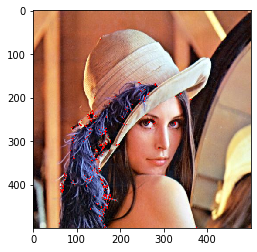

In [32]:
my_show(img)

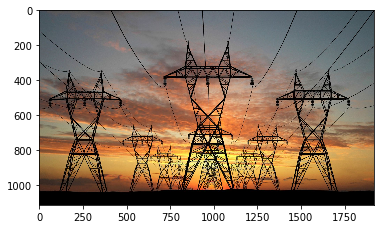

In [33]:
img_t = cv2.imread('tower.jpg',1)
my_show(img_t)

In [34]:
imgt_gray = (cv2.cvtColor(img_t,cv2.COLOR_BGR2GRAY))
imgt_harris = cv2.cornerHarris(imgt_gray,2,3,0.03)
imgt_harris = cv2.dilate(imgt_harris,None)
imgt_harris

array([[-4.5408838e-10, -2.8326641e-10,  2.0271040e-10, ...,
         2.6232067e-07,  9.3627050e-06,  9.3627050e-06],
       [-4.5408838e-10, -2.8326641e-10,  2.0271040e-10, ...,
         2.6232067e-07,  9.5346797e-05,  9.5346797e-05],
       [-1.3286509e-10, -4.4316571e-11,  2.0271040e-10, ...,
         2.6232067e-07,  1.9505988e-04,  1.9505988e-04],
       ...,
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32)

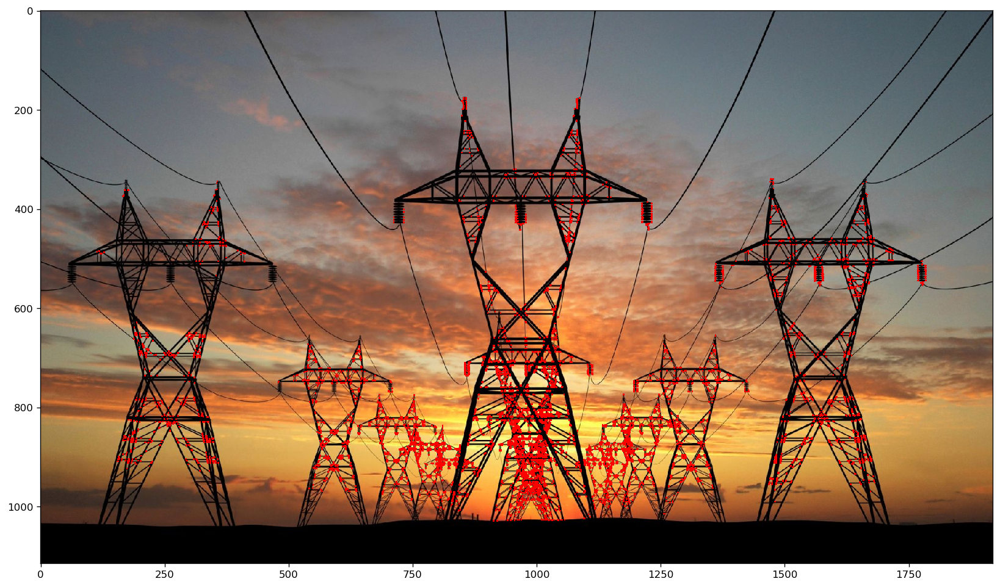

In [35]:
thresholdt = np.max(imgt_harris)*0.03
img_t[imgt_harris>thresholdt] = [0,0,255]
plt.figure(figsize=(20,10),dpi=120)
my_show(img_t)

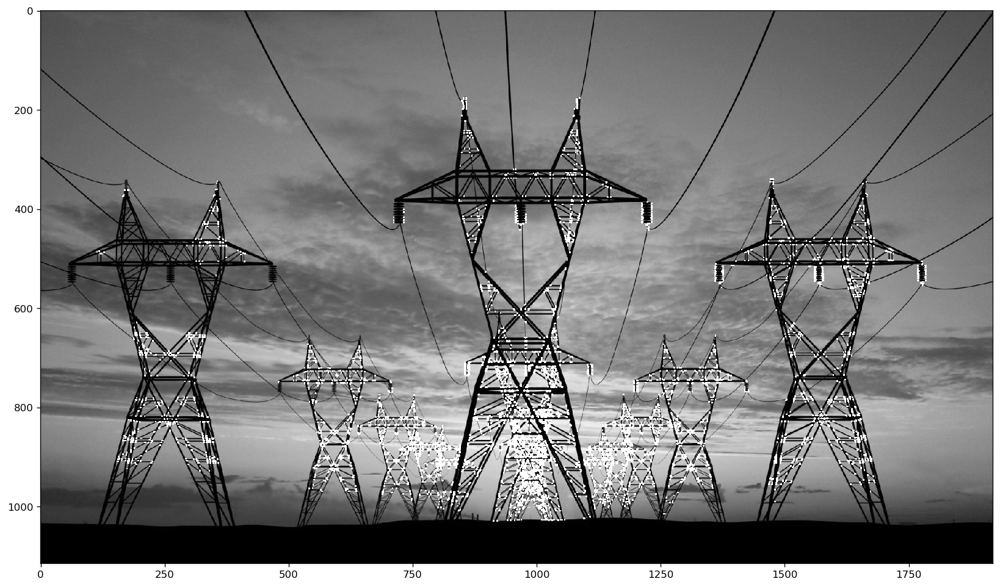

In [37]:
thresholdt = np.max(imgt_harris)*0.03
imgt_gray[imgt_harris>thresholdt] = 255
plt.figure(figsize=(20,10),dpi=120)
my_show_gray(imgt_gray)

## SIFT

In [38]:
cv2.__version__

'3.4.2'

In [40]:
img = cv2.imread('lenna_orig.jpg')
sift = cv2.xfeatures2d.SIFT_create()
# kp = sift.detect(img)

In [44]:
kp = sift.detect(img)

In [45]:
len(kp)

1329

In [47]:
kp, des = sift.compute(img,kp)
print(des.shape)

(1329, 128)


In [66]:
img_sift = cv2.drawKeypoints(img, kp, outImage=np.array([]),flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

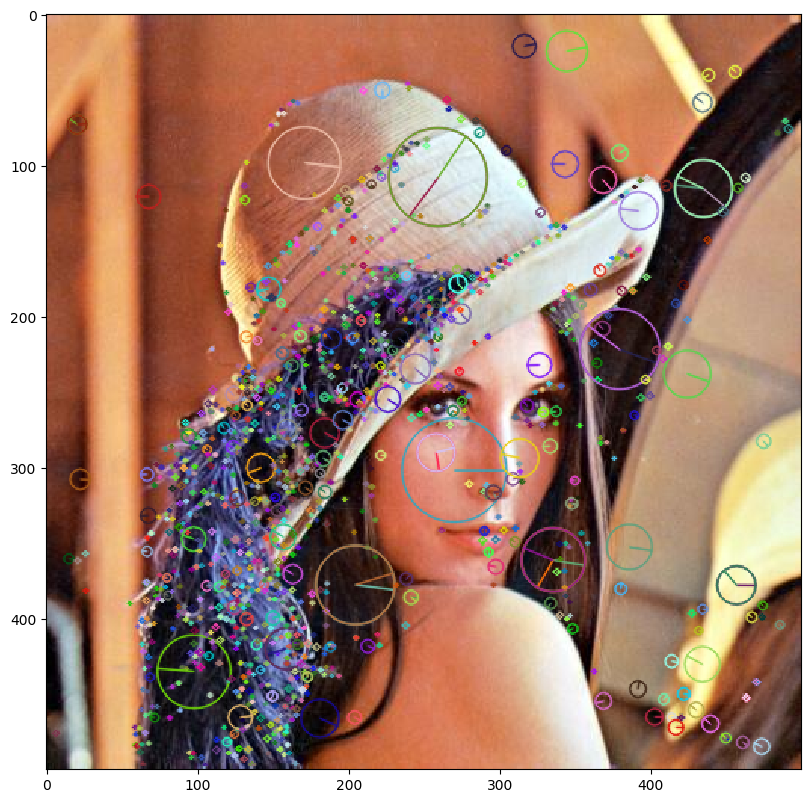

In [67]:
plt.figure(figsize=(10,10),dpi=100)
my_show(img_sift)